In [48]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("darkgrid")
plt.rcParams["figure.figsize"] = (10, 6) # Tamaño gráficos
plt.rcParams["figure.dpi"] = 200 # resolución gráficos

from sklearn.metrics import mean_squared_error, median_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression
from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV

import warnings
warnings.filterwarnings('ignore')

import sys
sys.path.append('../../utils/')
from calidad_datos import calidad_datos

In [42]:
df = pd.read_csv('../../data/un1_winequality-red.csv')

In [49]:
calidad_datos(df)

,tipo,nulos,porc_nulos,ceros,porc_ceros,count,mean,std,min,25%,50%,75%,max,dist_IQR,limit_inf,limit_sup,outliers
quality,int64,0,0.0,0,0.000000,1599.0,5.636023,0.807569,3.00000,5.0000,6.00000,6.000000,8.00000,1.000000,3.500000,7.500000,28
fixed acidity,float64,0,0.0,0,0.000000,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000,2.100000,3.950000,12.350000,49
volatile acidity,float64,0,0.0,0,0.000000,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000,0.250000,0.015000,1.015000,19
citric acid,float64,0,0.0,132,0.082552,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000,0.330000,-0.405000,0.915000,1
residual sugar,float64,0,0.0,0,0.000000,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000,0.700000,0.850000,3.650000,155
chlorides,float64,0,0.0,0,0.000000,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100,0.020000,0.040000,0.120000,112
free sulfur dioxide,float64,0,0.0,0,0.000000,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000,14.000000,-14.000000,42.000000,30
total sulfur dioxide,float64,0,0.0,0,0.000000,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000,40.000000,-38.000000,122.000000,55
density,float64,0,0.0,0,0.000000,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369,0.002235,0.992248,1.001187,45
pH,float64,0,0.0,0,0.000000,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000,0.190000,2.925000,3.685000,35


In [46]:
df.describe().round(4)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.0000,1599.0000,1599.0000,1599.0000,1599.0000,1599.0000,1599.0000,1599.0000,1599.0000,1599.0000,1599.0000,1599.0000
mean,8.3196,0.5278,0.2710,2.5388,0.0875,15.8749,46.4678,0.9967,3.3111,0.6581,10.4230,5.6360
std,1.7411,0.1791,0.1948,1.4099,0.0471,10.4602,32.8953,0.0019,0.1544,0.1695,1.0657,0.8076
min,4.6000,0.1200,0.0000,0.9000,0.0120,1.0000,6.0000,0.9901,2.7400,0.3300,8.4000,3.0000
25%,7.1000,0.3900,0.0900,1.9000,0.0700,7.0000,22.0000,0.9956,3.2100,0.5500,9.5000,5.0000
50%,7.9000,0.5200,0.2600,2.2000,0.0790,14.0000,38.0000,0.9968,3.3100,0.6200,10.2000,6.0000
75%,9.2000,0.6400,0.4200,2.6000,0.0900,21.0000,62.0000,0.9978,3.4000,0.7300,11.1000,6.0000
max,15.9000,1.5800,1.0000,15.5000,0.6110,72.0000,289.0000,1.0037,4.0100,2.0000,14.9000,8.0000


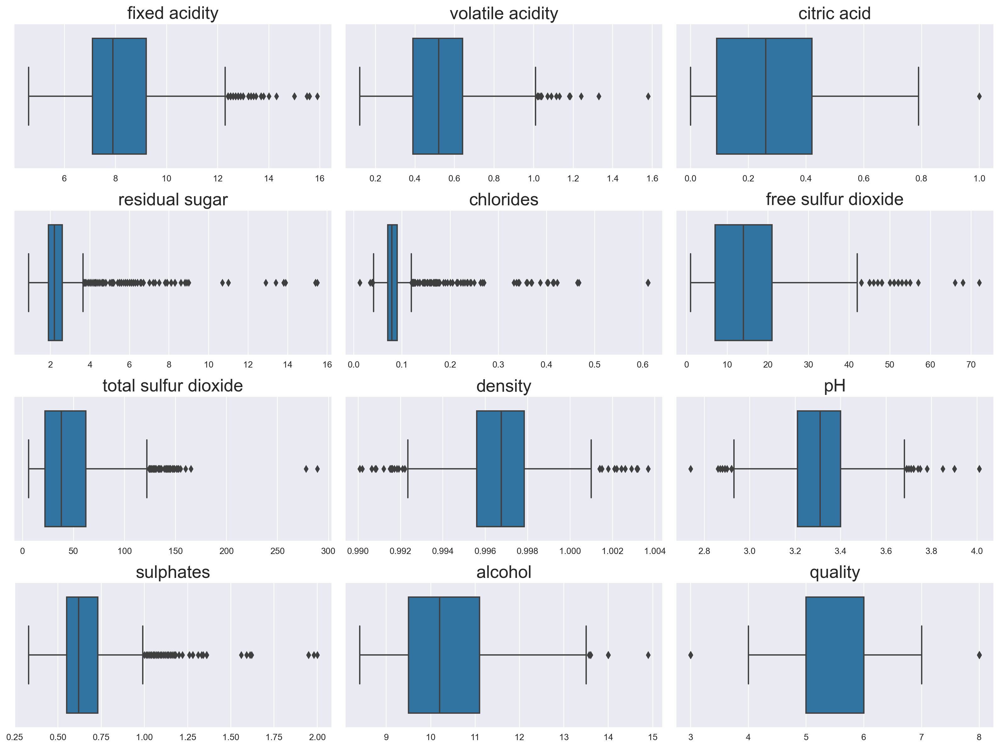

In [5]:
cols = 3
rows = int(df.shape[1] / cols)
size_fact = 4
plt.figure(figsize=(rows*size_fact, cols*size_fact))
for i, col in enumerate(df.columns):
    plt.subplot(rows, cols, i + 1)
    sns.boxplot(df[col])
    plt.title(col, fontsize=20 )
    plt.xlabel('')
    plt.tight_layout()

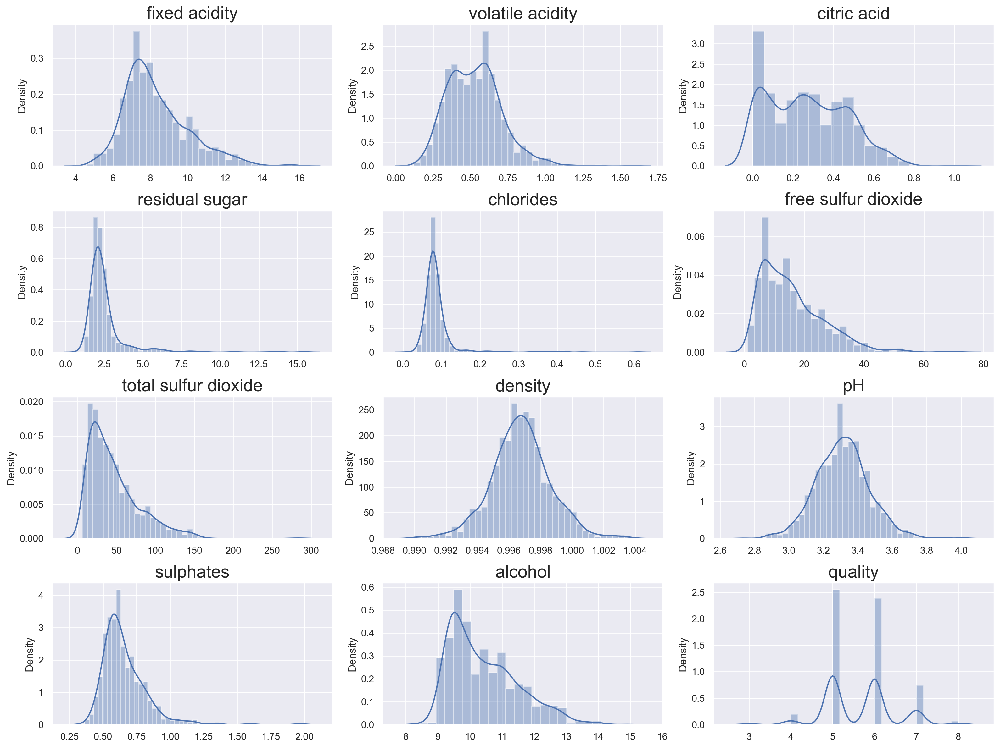

In [47]:
cols = 3
rows = int(df.shape[1] / cols)
size_fact = 4
plt.figure(figsize=(rows*size_fact, cols*size_fact))
for i, col in enumerate(df.columns):
    plt.subplot(rows, cols, i + 1)
    sns.distplot(df[col])
    plt.title(col, fontsize=20)
    plt.xlabel('')
    plt.tight_layout()

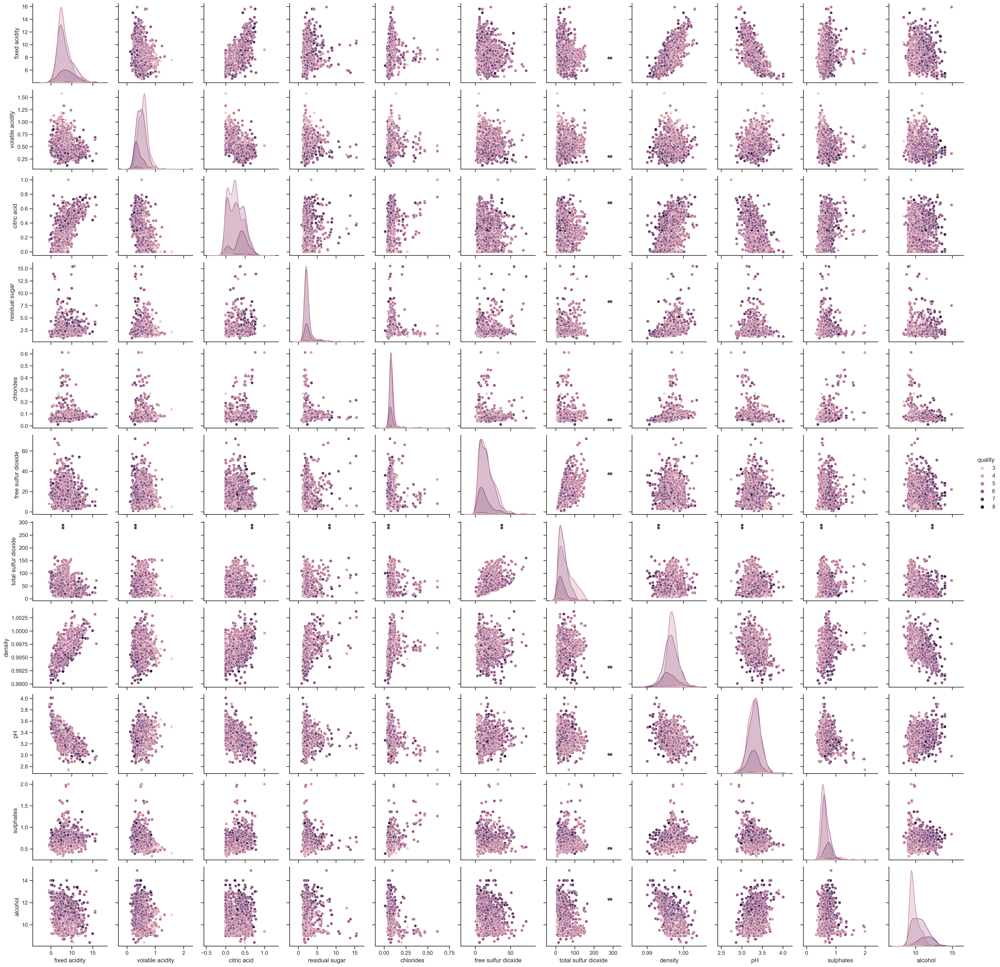

In [7]:
sns.set(style="ticks") 
sns.pairplot(df, hue="quality");

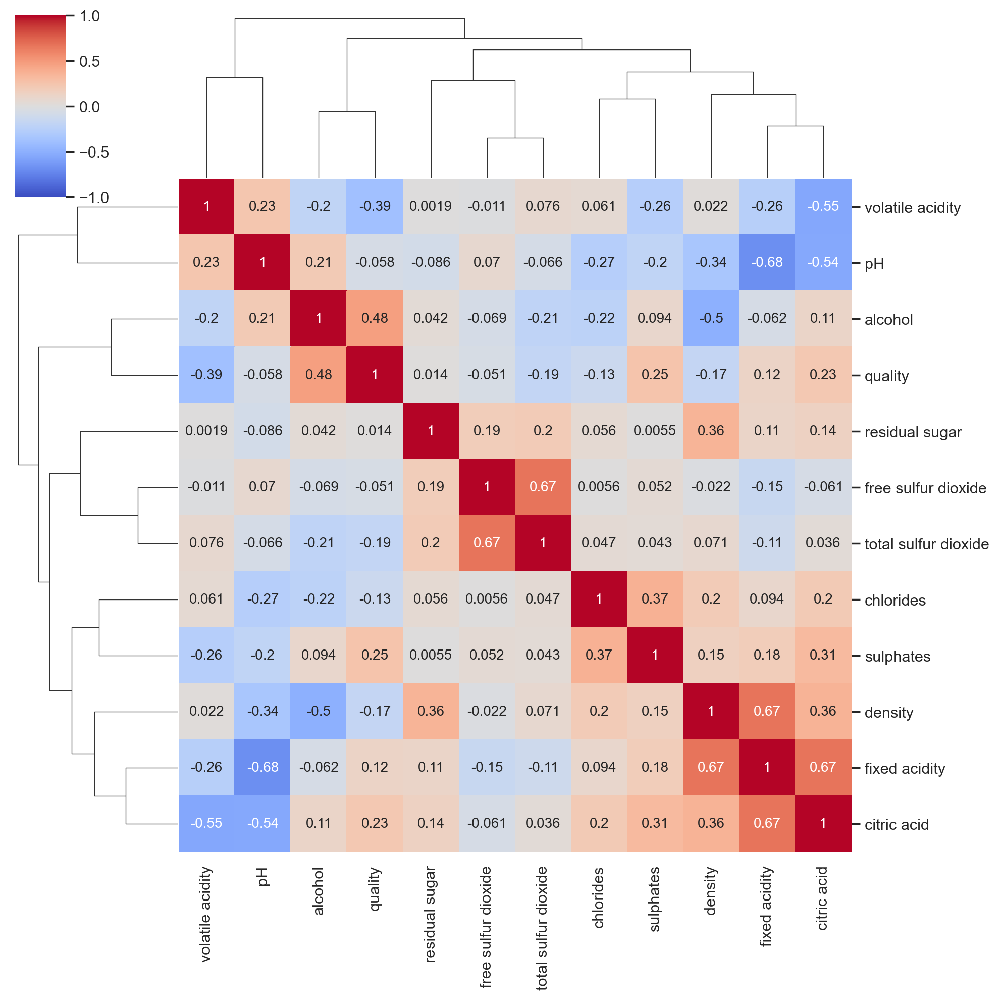

In [52]:
sns.clustermap(df.corr(),cbar_kws={"shrink":.5}, cmap="coolwarm", vmin=-1, vmax=1, annot=True);

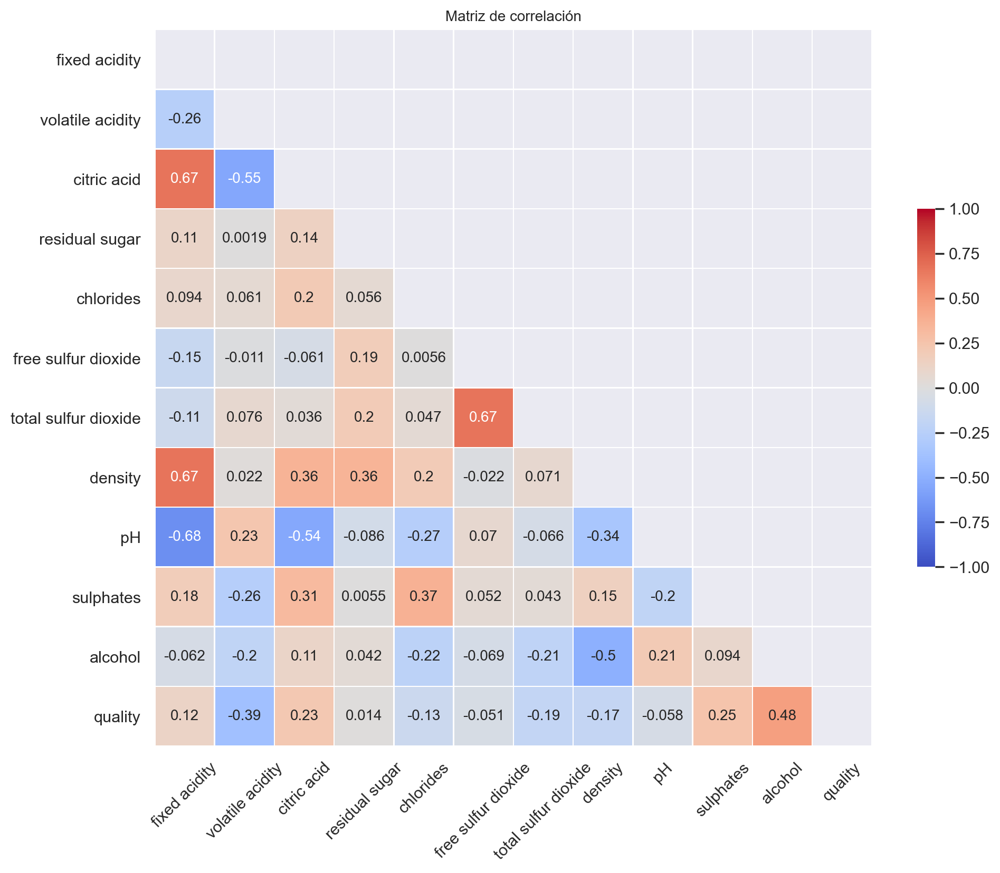

In [53]:
mask = np.zeros_like(df.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(11,9))
plt.title("Matriz de correlación", fontsize = 10)
sns.heatmap(df.corr(),mask = mask, center = 0, square = True, linewidths = .5, cbar_kws={"shrink":.5}, cmap="coolwarm", vmin=-1, vmax=1, annot=True);
plt.xticks(rotation = 45);

In [54]:
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df), columns = df.columns)
#df_scaled['intercept'] = 1
x_train, x_test, y_train, y_test = train_test_split( df_scaled.iloc[:, :-1], df_scaled.iloc[:,-1], test_size = 0.25, shuffle=True, random_state = 42)

In [57]:
linear_reg = LinearRegression()
linear_reg.fit(x_train, y_train)
linear_mae = median_absolute_error(linear_reg.predict(x_test), y_test)
linear_rmse = np.sqrt(mean_squared_error(linear_reg.predict(x_test), y_test))
#print('Valor del parámetro de regularización: {0}'.format(linear_reg.alpha_))
print('Coeficientes finales: \n{0}'.format(linear_reg.coef_))
print('RMSE de pruebas: {0}'.format(linear_rmse))
print('MAE de pruebas: {0}'.format(linear_mae))

Coeficientes finales: 
[ 0.04712959 -0.22365466 -0.03230024  0.01546762 -0.10231545  0.06487381
 -0.14885171 -0.03791555 -0.06575238  0.17207822  0.37770634]
RMSE de pruebas: 0.7718637339801693
MAE de pruebas: 0.5078599130327311


In [55]:
x_train.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

In [27]:
ridge_cv = RidgeCV(cv=10)
model_ridge = ridge_cv.fit(x_train, y_train)
ridge_mae = median_absolute_error(model_ridge.predict(x_test), y_test)
ridge_rmse = np.sqrt(mean_squared_error(model_ridge.predict(x_test),
y_test))
print('Valor del parámetro de regularización: {0}'.format(model_ridge.alpha_))
print('Coeficientes finales: \n{0}'.format(model_ridge.coef_))
print('RMSE de pruebas: {0}'.format(ridge_rmse))
print('MAE de pruebas: {0}'.format(ridge_mae))

Valor del parámetro de regularización: 10.0
Coeficientes finales: 
[ 0.05171984 -0.22122281 -0.02862004  0.01735463 -0.10189407  0.06280238
 -0.14710856 -0.04461045 -0.06103819  0.17180412  0.37102758]
RMSE de pruebas: 0.7719574117959531
MAE de pruebas: 0.5049691736036988


In [17]:
lasso_cv = LassoCV(cv=10)
model_lasso = lasso_cv.fit(x_train, y_train)
lasso_mae = median_absolute_error(model_lasso.predict(x_test), y_test)
lasso_rmse = np.sqrt(mean_squared_error(model_lasso.predict(x_test),
y_test))
print('Valor del parámetro de regularización: {0}'.format(model_lasso.alpha_))
print('Coeficientes finales: \n{0}'.format(model_lasso.coef_))
print('RMSE de pruebas: {0}'.format(lasso_rmse))
print('MAE de pruebas: {0}'.format(lasso_mae))

Valor del parámetro de regularización: 0.011266843992228975
Coeficientes finales: 
[ 0.         -0.21485994 -0.          0.         -0.09162251  0.03463127
 -0.12215256 -0.         -0.05820333  0.15389476  0.38731718]
RMSE de pruebas: 0.7751017515608976
MAE de pruebas: 0.5189379130363738


In [18]:
enet_cv = ElasticNetCV(cv=10) # alpha [norma1], beta [ norma 2]
# alpha, ratio
model_enet = enet_cv.fit(x_train, y_train)
enet_mae = median_absolute_error(model_enet.predict(x_test), y_test)
enet_rmse = np.sqrt(mean_squared_error(model_enet.predict(x_test), y_test))
print('Valor del parámetro de regularización: {0}'.format(model_enet.alpha_))
print('Coeficientes finales: \n{0}'.format(model_enet.coef_))
print('RMSE de pruebas: {0}'.format(enet_rmse))
print('MAE de pruebas: {0}'.format(enet_mae))

Valor del parámetro de regularización: 0.019598652649782625
Coeficientes finales: 
[ 0.         -0.21395852 -0.          0.         -0.09322958  0.03754834
 -0.12505964 -0.         -0.05942415  0.15469553  0.38456393]
RMSE de pruebas: 0.7749040231817501
MAE de pruebas: 0.5182080941600191


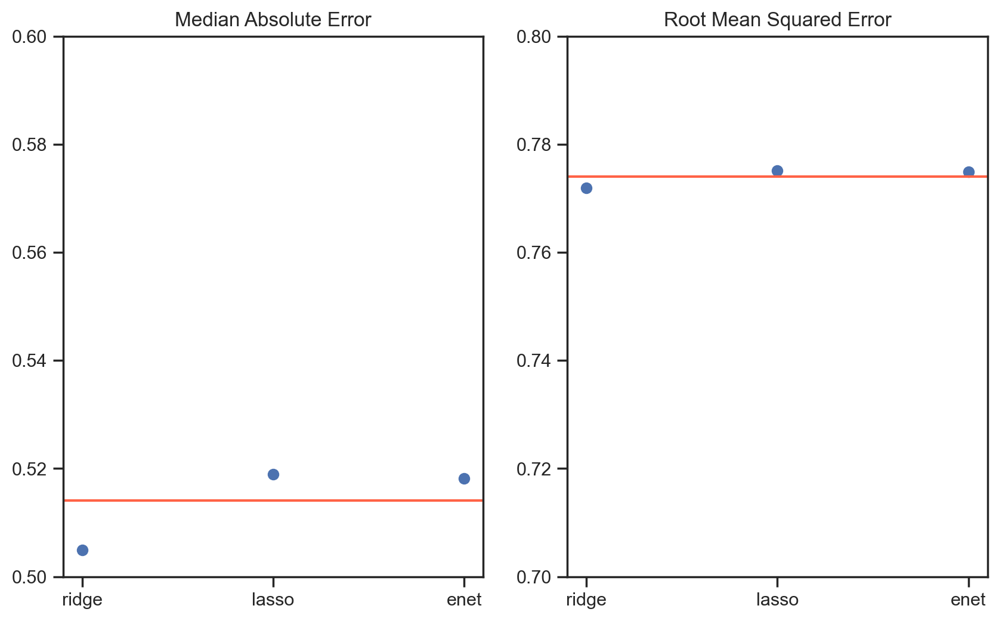

In [19]:
plt.subplot(1, 2, 1)
plt.plot(['ridge', 'lasso', 'enet'], [ridge_mae, lasso_mae, enet_mae],
'o')
plt.axhline(np.mean([ridge_mae, lasso_mae, enet_mae]), color='tomato')
plt.ylim(.5, .6)
plt.title('Median Absolute Error')
plt.subplot(1, 2, 2)
plt.plot(['ridge', 'lasso', 'enet'],[ridge_rmse, lasso_rmse, enet_rmse],
'o')
plt.axhline(np.mean([ridge_rmse, lasso_rmse, enet_rmse]),
color='tomato')
plt.ylim(.7, .8)
plt.title('Root Mean Squared Error');

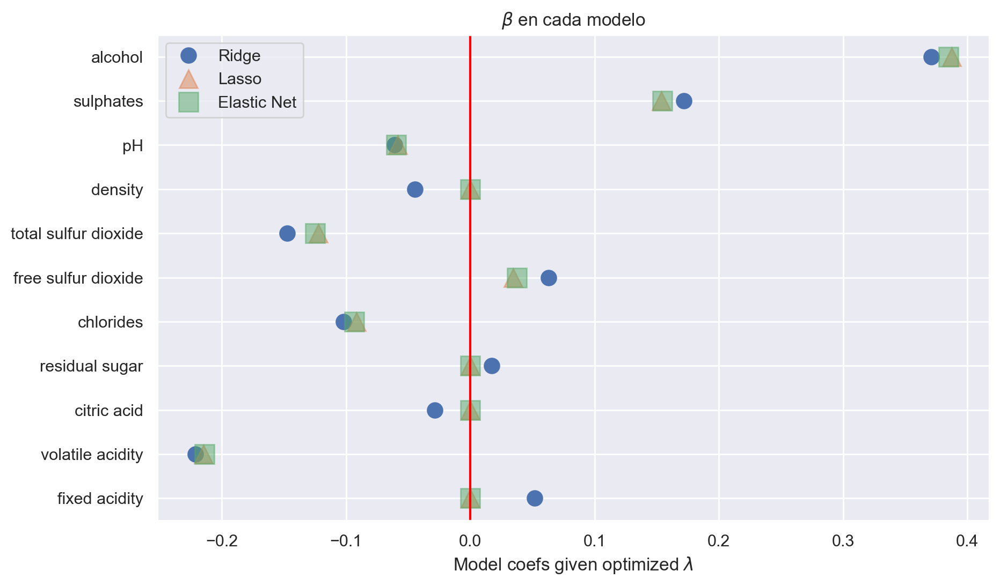

In [56]:
comparecoefs = pd.DataFrame({'ridge':model_ridge.coef_, 'lasso':
model_lasso.coef_, 'enet':
model_enet.coef_})
comparecoefs['coefs'] = df.columns.drop('quality')
plt.plot(comparecoefs['ridge'],comparecoefs['coefs'], 'o',
label='Ridge', markersize=10)
plt.plot(comparecoefs['lasso'],comparecoefs['coefs'], '^', alpha=.5,
label='Lasso', markersize=12)
plt.plot(comparecoefs['enet'],comparecoefs['coefs'], 's', alpha=.5,
label='Elastic Net', markersize=13)
plt.axvline(0, color='red')
plt.xlabel(r'Model coefs given optimized $\lambda$');
plt.legend()
plt.title(r'$\beta$ en cada modelo' );